# AMT
### Libraries

In [18]:
from pytube import YouTube
from pydub import AudioSegment
import os
# Visualize
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import IPython.display as ipd
from vscode_audio import Audio
from ipywidgets import interactive_output
from ipywidgets import IntSlider, FloatSlider, fixed, Checkbox
from ipywidgets import VBox, Label
# Audio
import librosa, librosa.display
from midiutil import MIDIFile
from music21.tempo import MetronomeMark
from music21.note import Note, Rest
from music21.stream import Stream
from music21 import metadata
from music21 import instrument
from music21 import midi
from music21.key import Key

### Download and Convert .wav

In [10]:
wav_path = "wav_data"

def download_and_convert_wav():
    if not os.path.exists(wav_path): os.mkdir(wav_path)
    singer_song = input("가수 - 제목: ")
    yt = YouTube(input("음원 유튜브 url: "))
    yt.streams.filter(only_audio=True).first().download(output_path=wav_path, filename=singer_song+".mp3")
    AudioSegment.from_file(os.path.join(wav_path, singer_song+".mp3")).export(os.path.join(wav_path, singer_song+".wav"), format="wav")
    os.remove(os.path.join(wav_path, singer_song+".mp3"))

In [12]:
download_and_convert_wav()

### Configuration

In [46]:
plt.rc("figure", figsize=(16, 8))

fs = 44100                               # Sampling Frequency
nfft = 2048                              # length of the FFT window
overlap = 0.5                            # Hop overlap percentage
hop_length = int(nfft*(1-overlap))       # Number of samples between successive frames
n_bins = 72                              # Number of frequency bins
mag_exp = 4                              # Magnitude Exponent
pre_post_max = 6                         # Pre- and post- samples for peak picking
cqt_threshold = -61                      # Threshold for CQT dB levels, all values below threshold are set to -120 dB

### Load Audio

In [54]:
filename = os.path.join(wav_path, "건즈앤로지스 - 스윗오마일차일드"+".wav")

x, fs = librosa.load(filename, sr=None, mono=True, duration=12)

# Audio Data Info.
print(f"Signal Shape: {x.shape}")
print(f"Sample Rate: {fs}")
print(f"Audio Length in Second = {x.shape[0]/fs} [s]")
# VSC에서 IPython.display 실행 안됨
Audio(x, sr=fs)

Signal Shape: (529200,)
Sample Rate: 44100
Audio Length in Second = 12.0 [s]


### CQT vs FFT
Constant Q 변환과 푸리에 변환 비교

In [49]:
# CQT Frequencies
cqt_freqs = librosa.core.cqt_frequencies(n_bins=128, fmin=librosa.note_to_hz('C0'), bins_per_octave=12)

# FFT Frequencies
fft_freqs = librosa.fft_frequencies(sr=44100, n_fft=128)

# Notes Center Frequencies
notes_freqs = 440*2**(np.arange(-57, (128-57))/12)

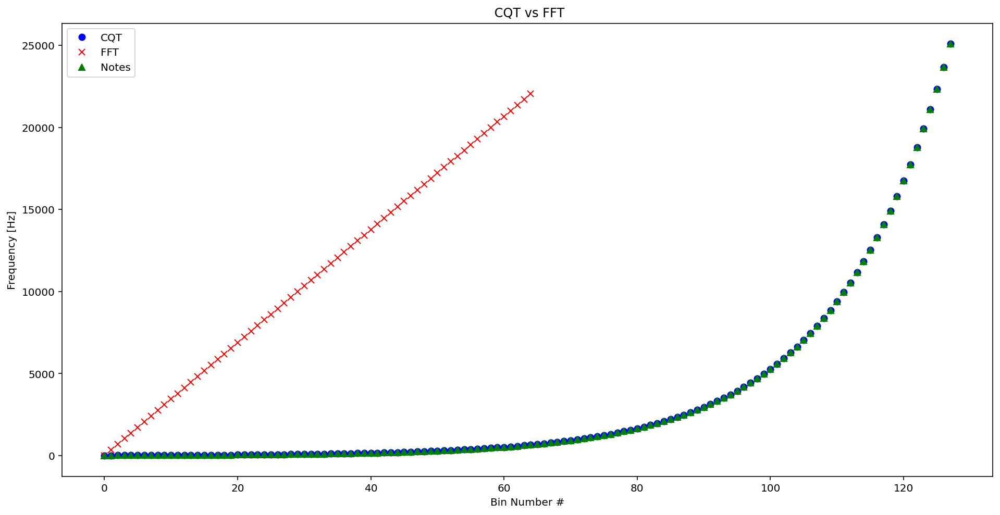

In [50]:
plt.figure()
plt.plot(cqt_freqs, 'bo', label='CQT')
plt.plot(fft_freqs, 'rx', label= 'FFT')
plt.plot(notes_freqs, 'g^', label = 'Notes')
plt.title(" CQT vs FFT")
plt.xlabel('Bin Number #')
plt.ylabel('Frequency [Hz]')
plt.legend();

#### CQT

In [51]:
def calc_cqt(x,fs=fs,hop_length=hop_length, n_bins=n_bins, mag_exp=mag_exp):
    C = librosa.cqt(x, sr=fs, hop_length=hop_length, fmin=None, n_bins=n_bins)
    C_mag = librosa.magphase(C)[0]**mag_exp
    CdB = librosa.core.amplitude_to_db(C_mag ,ref=np.max)
    return CdB
# CQT Threshold
def cqt_thresholded(cqt,thres=cqt_threshold):
    new_cqt=np.copy(cqt)
    new_cqt[new_cqt<thres]=-120
    return new_cqt
# Onset Envelope from Cqt
def calc_onset_env(cqt):
    return librosa.onset.onset_strength(S=cqt, sr=fs, aggregate=np.mean, hop_length=hop_length)
# Onset from Onset Envelope
def calc_onset(cqt, pre_post_max=pre_post_max, backtrack=True):
    onset_env=calc_onset_env(cqt)
    onset_frames = librosa.onset.onset_detect(onset_envelope=onset_env,
                                           sr=fs, units='frames', 
                                           hop_length=hop_length, 
                                           backtrack=backtrack,
                                           pre_max=pre_post_max,
                                           post_max=pre_post_max)
    onset_boundaries = np.concatenate([[0], onset_frames, [cqt.shape[1]]])
    onset_times = librosa.frames_to_time(onset_boundaries, sr=fs, hop_length=hop_length)
    return [onset_times, onset_boundaries, onset_env]

음악이 어디서 시작할것인가? -> onset detection

### Fine Tuning UI

In [52]:
# Fine Tuning UI
style = {'description_width': 'initial'}
mag_exp_slider=IntSlider(value=mag_exp, min=1, max=32, step=1, 
                         description='mag_exp:',continuous_update=False)

thres_slider=IntSlider(value=cqt_threshold, min=-120, max=0, step=1, 
                                                     description='Threshold:',continuous_update=False)

pre_post_slider=IntSlider(value=pre_post_max, min=1, max=32, step=1, 
                         description='Pre_post_max:',continuous_update=False, style=style)

backtrack_box=Checkbox(value=False,description='backtrack',disabled=False)


def inter_cqt_tuning(mag_exp,thres,pre_post_max, backtrack):
    thres=thres_slider.value
    mag_exp=mag_exp_slider.value
    pre_post_max=pre_post_slider.value
    backtrack=backtrack_box.value
    global CdB
    CdB = calc_cqt(x,fs,hop_length, n_bins, mag_exp)
    plt.figure()
    new_cqt=cqt_thresholded(CdB,thres)
    librosa.display.specshow(new_cqt, sr=fs, hop_length=hop_length, x_axis='time', y_axis='cqt_note', cmap='coolwarm')
    plt.ylim([librosa.note_to_hz('B2'),librosa.note_to_hz('B6')])
    global onsets
    onsets=calc_onset(new_cqt,pre_post_max, backtrack)
    plt.vlines(onsets[0], 0, fs/2, color='k', alpha=0.8)
    plt.title("CQT - Sweet Child O' Mine Intro")
    plt.colorbar()
    plt.show()

In [55]:
# Display UI
out = interactive_output(inter_cqt_tuning,  {'mag_exp': mag_exp_slider, 'thres': thres_slider, 
                                             'pre_post_max': pre_post_slider, 'backtrack':backtrack_box})
ui = VBox([mag_exp_slider, thres_slider, pre_post_slider, backtrack_box])
display(ui, out)

Output()

### Estimate Tempo (BPM)

In [56]:
tempo, beats=librosa.beat.beat_track(y=None, sr=fs, onset_envelope=onsets[2], hop_length=hop_length,
               start_bpm=120.0, tightness=100, trim=True, bpm=None,
               units='frames')
tempo=int(2*round(tempo/2))
mm = MetronomeMark(referent='quarter', number=tempo)

In [60]:
# Convert Seconds to Quarter-Notes
def time_to_beat(duration, tempo):
    return (tempo*duration/60)
# Remap input to 0-1 for Sine Amplitude or to 0-127 for MIDI
def remap(x, in_min, in_max, out_min, out_max):
    return (x - in_min) * (out_max - out_min) / (in_max - in_min) + out_min
# Generate Sinewave, MIDI Notes and music21 notes
def generate_sine_midi_note(f0_info, sr, n_duration, round_to_sixtenth=True):
    f0=f0_info[0]
    A=remap(f0_info[1], CdB.min(), CdB.max(), 0, 1)
    duration = librosa.frames_to_time(n_duration, sr=fs, hop_length=hop_length)
    #Generate Midi Note and music21 note
    note_duration = 0.02*np.around(duration/2/0.02) # Round to 2 decimal places for music21 compatibility
    midi_duration = time_to_beat(duration, tempo)
    midi_velocity=int(round(remap(f0_info[1], CdB.min(), CdB.max(), 0, 127)))
    if round_to_sixtenth:
        midi_duration=round(midi_duration*16)/16
    if f0==None:
        midi_note=None
        note_info=Rest(type=mm.secondsToDuration(note_duration).type)
        f0=0
    else:
        midi_note=round(librosa.hz_to_midi(f0))
        note = Note(librosa.midi_to_note(midi_note).replace("♯","#"), type=mm.secondsToDuration(note_duration).type)
        note.volume.velocity = midi_velocity
        note_info = [note]
    midi_info = [midi_note, midi_duration, midi_velocity]
            
    # Generate Sinewave
    n = np.arange(librosa.frames_to_samples(n_duration, hop_length=hop_length ))
    sine_wave = A*np.sin(2*np.pi*f0*n/float(sr))
    return [sine_wave, midi_info, note_info]

### Estimate Pitch

In [58]:
def estimate_pitch(segment, threshold):
    freqs = librosa.cqt_frequencies(n_bins=n_bins, fmin=librosa.note_to_hz('C1'),
                            bins_per_octave=12)
    if segment.max()<threshold:
        return [None, np.mean((np.amax(segment,axis=0)))]
    else:
        f0 = int(np.mean((np.argmax(segment,axis=0))))
    return [freqs[f0], np.mean((np.amax(segment,axis=0)))]
# Generate notes from Pitch estimation
def estimate_pitch_and_notes(x, onset_boundaries, i, sr):
    n0 = onset_boundaries[i]
    n1 = onset_boundaries[i+1]
    f0_info = estimate_pitch(np.mean(x[:,n0:n1],axis=1),threshold=cqt_threshold)
    return generate_sine_midi_note(f0_info, sr, n1-n0)


In [61]:
# Array of music information - Sinewave, MIDI Notes and muisc21 Notes
music_info = np.array([
    estimate_pitch_and_notes(CdB, onsets[1], i, sr=fs)
    for i in range(len(onsets[1])-1)
])

/var/folders/bg/w2v8q46j0sg8s1v2yx490m6h0000gn/T/ipykernel_2794/2222270265.py:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  music_info = np.array([


In [62]:
# Get sinewave 
synth_audio=np.concatenate(music_info[:,0])

In [64]:
Audio(synth_audio, sr=fs)

In [65]:
# Get music21 notes
note_info = list(music_info[: ,2])

In [66]:
# Create music21 stream
s = Stream()
s.append(mm)
electricguitar = instrument.fromString('electric guitar')
electricguitar.midiChannel=0
electricguitar.midiProgram=30  #Set program to Overdriven Guitar
s.append(electricguitar)
s.insert(0, metadata.Metadata())
s.metadata.title = "Sweet Child O' Mine - Introduction"
s.metadata.composer = "Guns n' Roses"
for note in note_info:
    s.append(note)

In [67]:
# Analyse music21 stream to get song Key
key=s.analyze('key')
print(key.name)
# Insert Key to Stream
s.insert(0, key)

C# major


In [68]:
# Display music21 stream
# If you have Musescore installed and configured displays music score - https://musescore.org/en
#s.show() # You must have Nusescore installed and Configured to run this and display the music score

# Show stream as text
s.show('text')

{0.0} <music21.metadata.Metadata object at 0x29df57b20>
{0.0} <music21.instrument.ElectricGuitar 'electric guitar'>
{0.0} <music21.tempo.MetronomeMark allegro moderato Quarter=130>
{0.0} <music21.key.Key of C# major>
{0.0} <music21.note.Rest half>
{2.0} <music21.note.Note C#>
{2.5} <music21.note.Note C#>
{2.75} <music21.note.Note G#>
{3.25} <music21.note.Note F#>
{3.75} <music21.note.Note F#>
{4.0} <music21.note.Note G#>
{4.5} <music21.note.Note F>
{5.0} <music21.note.Note G#>
{5.5} <music21.note.Note C#>
{6.0} <music21.note.Note C#>
{6.5} <music21.note.Note G#>
{7.0} <music21.note.Note F#>
{7.5} <music21.note.Note F#>
{8.0} <music21.note.Note G#>
{8.25} <music21.note.Note F>
{8.75} <music21.note.Note G#>
{9.0} <music21.note.Note D#>
{9.5} <music21.note.Note C#>
{10.0} <music21.note.Note G#>
{10.25} <music21.note.Note F#>
{11.25} <music21.note.Note G#>
{11.75} <music21.note.Note F>
{12.25} <music21.note.Note G#>
{12.75} <music21.note.Note D#>
{13.25} <music21.note.Note C#>
{13.75} <mus

In [69]:
# Listen to music21 stream as MIDI
s.show('midi') 

# Pygame play - Needs pygame to be installed
#sp = midi.realtime.StreamPlayer(s)
#sp.play()

In [70]:
# Save MIdi to file
s.write('midi', 'sweet_child_music21.mid')

# Another way for saving midi
#mf = midi.translate.streamToMidiFile(s)
#mf.open('sweet_child_mine'+'.mid', 'wb')
#mf.write()
#mf.close()

'sweet_child_music21.mid'

In [71]:
# Get MIDI Information
midi_info = list(music_info[:,1])

In [73]:
# Save midi file from MIDI information using MIDIUtils - not using anything from music21, 
track    = 0
channel  = 0
tempo    = tempo  # In BPM
volume   = 100  # 0-127, as per the MIDI standard

gnr = MIDIFile(1)  # One track, defaults to format 1 (tempo track is created
                      # automatically)
gnr.addTrackName(0,0,"Guns n' Roses - Sweet Child O' Mine - Intro")
program = 30 # Overdriven Guitar
gnr.addProgramChange(track, channel, 0, program)
gnr.addTempo(track, 0, tempo)

note_time=0
for i, note in enumerate(midi_info):
    if note[0]==None:
        note_time+=note[1]
    else:
        note_time+=note[1]
        gnr.addNote(track, channel, int(note[0]), note_time, note[1], note[2])

with open("sweet_child_midiutils.mid", "wb") as output_file:
    gnr.writeFile(output_file)